This notebook follows the tutorial:
https://pillow.readthedocs.io/en/3.3.x/handbook/tutorial.html

In [47]:
from PIL import Image

In [48]:
im = Image.open('sample-photo.png')

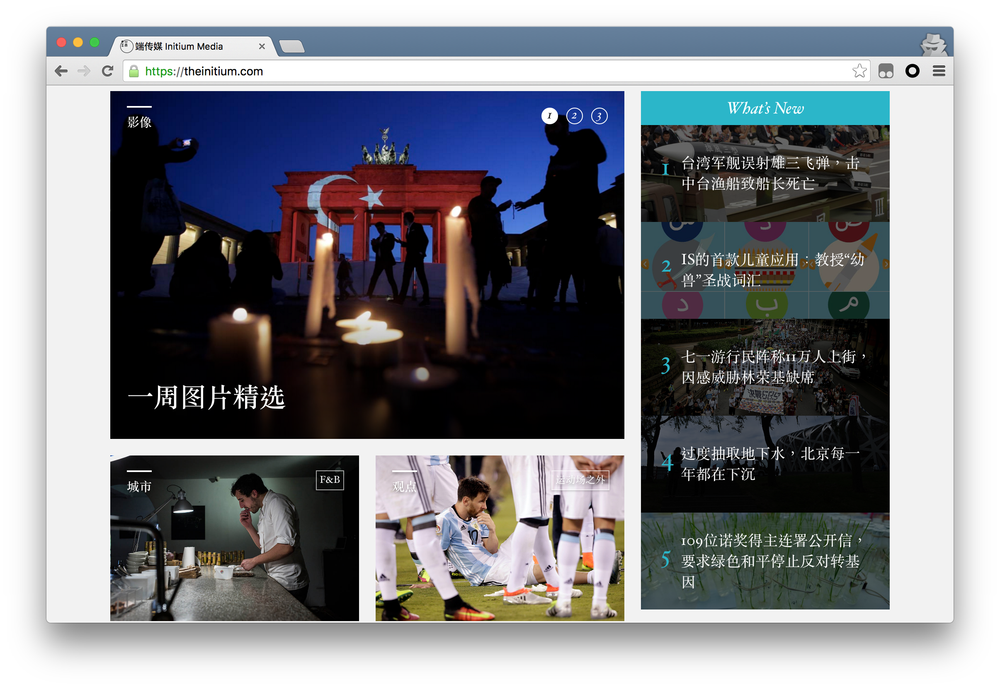

In [49]:
im

In [50]:
im.format

'PNG'

In [51]:
im.size

(2412, 1664)

In [52]:
im.save('sample-photo.jpg')

In [53]:
%%bash
ls -l sample-photo.*

-rw-r--r-- 1 1000 staff  336416 Jul  2 07:04 sample-photo.jpg
-rw-r--r-- 1 1000 staff 3045195 Jul  2 06:49 sample-photo.png


JPG is much smaller than PNG

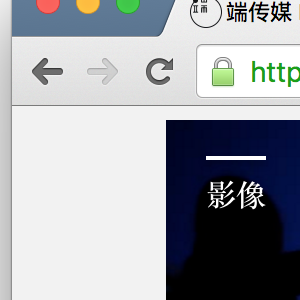

In [54]:
# The region is defined by a 4-tuple, where coordinates are (left, upper, right, lower)
box = (100, 100, 400, 400)
region = im.crop(box)
region

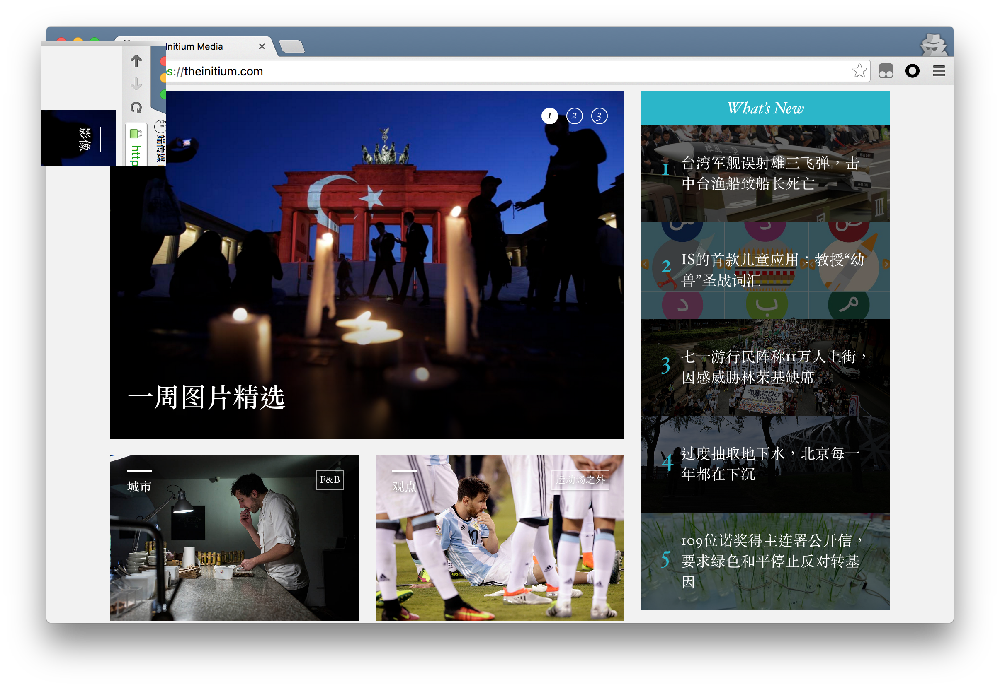

In [55]:
region = im.crop(box)
region = region.transpose(Image.ROTATE_270)
im.paste(region, box)
im

In [56]:
help(im.load)

Help on method load in module PIL.ImageFile:

load() method of PIL.PngImagePlugin.PngImageFile instance
    Load image data based on tile list



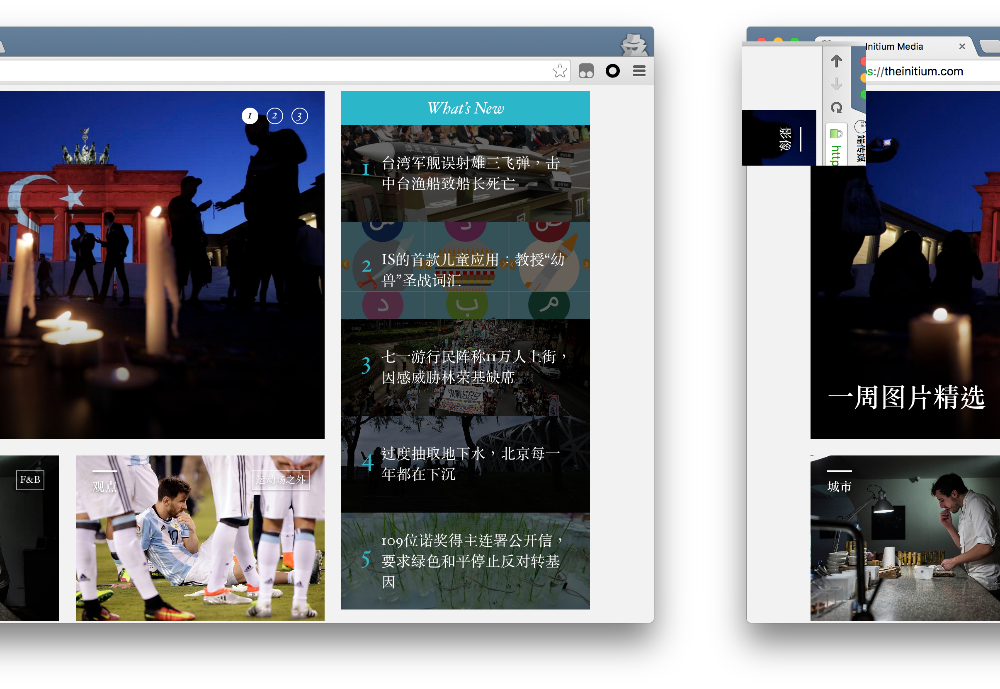

In [57]:
def roll(image, delta):
    "Roll an image sideways"

    xsize, ysize = image.size

    delta = delta % xsize
    if delta == 0: return image

    part1 = image.crop((0, 0, delta, ysize))
    part2 = image.crop((delta, 0, xsize, ysize))
    part1.load()
    part2.load()
    image.paste(part2, (0, 0, xsize-delta, ysize))
    image.paste(part1, (xsize-delta, 0, xsize, ysize))

    return image
roll(im, int(im.size[0] * 0.3))

# x is horizontal
# y is vertical

In [58]:
r, g, b, a = im.split()
im2 = Image.merge("RGB", (b, g, r))

In [59]:
#im.split()

In [60]:
help(im.split)

Help on method split in module PIL.Image:

split() method of PIL.PngImagePlugin.PngImageFile instance
    Split this image into individual bands. This method returns a
    tuple of individual image bands from an image. For example,
    splitting an "RGB" image creates three new images each
    containing a copy of one of the original bands (red, green,
    blue).
    
    :returns: A tuple containing bands.



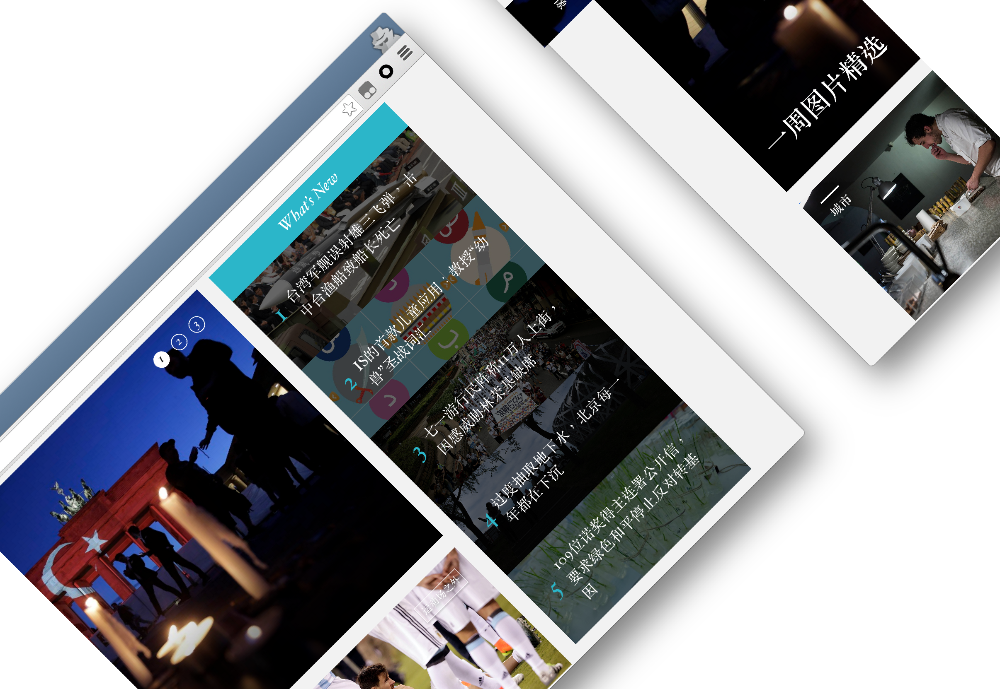

In [70]:
rotated = im.rotate(45)
rotated.save('rotated.png')
rotated

In [86]:
im = im.crop((200, 300, 600, 700))

In [87]:
def composite_two(left, right):
    w, h = left.size
    background = Image.new('RGBA', (w * 2, h), (255, 255, 255, 255))
    background.paste(left, (0, 0, w, h))
    background.paste(right, (w, 0, w * 2, h))
    return background

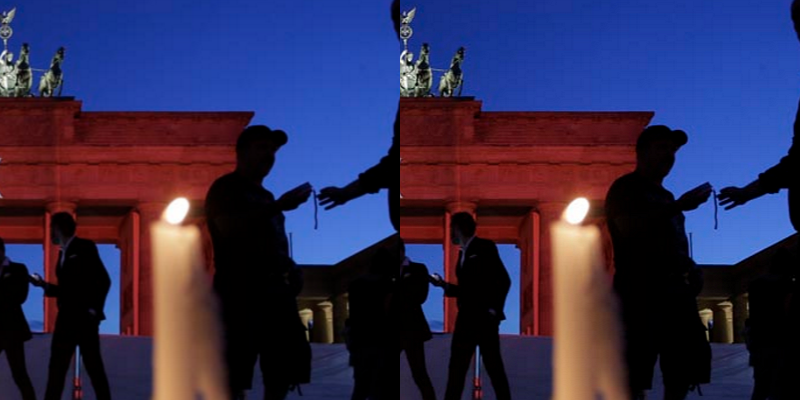

In [88]:
from PIL import ImageFilter
out = im.filter(ImageFilter.DETAIL)
composite_two(im, out)

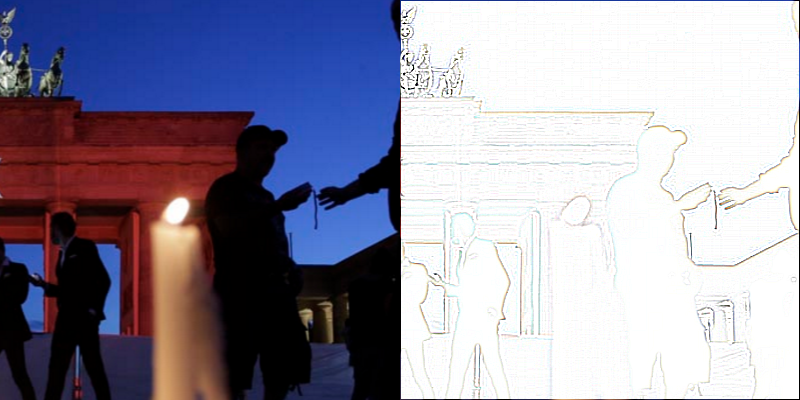

In [89]:
out = im.filter(ImageFilter.CONTOUR)
composite_two(im, out)

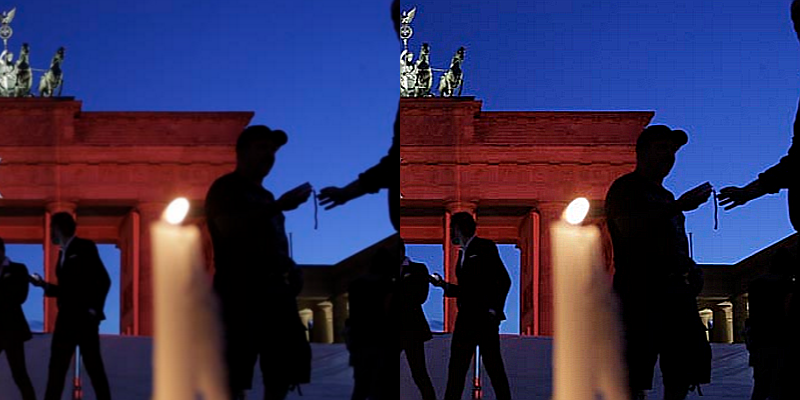

In [90]:
out = im.filter(ImageFilter.EDGE_ENHANCE)
composite_two(im, out)

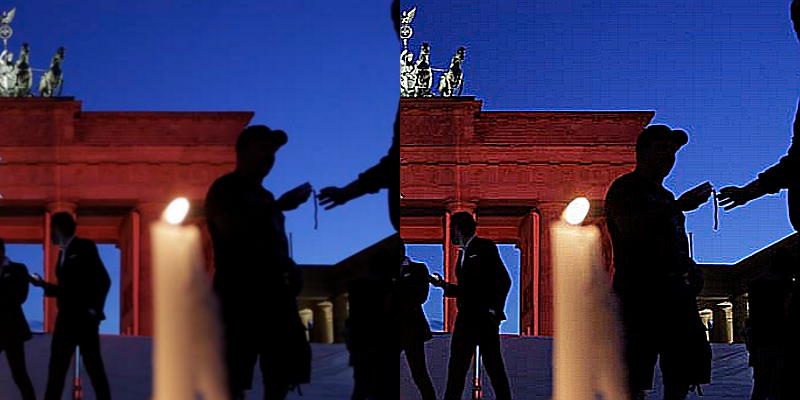

In [92]:
out = im.filter(ImageFilter.EDGE_ENHANCE_MORE)
composite_two(im, out)

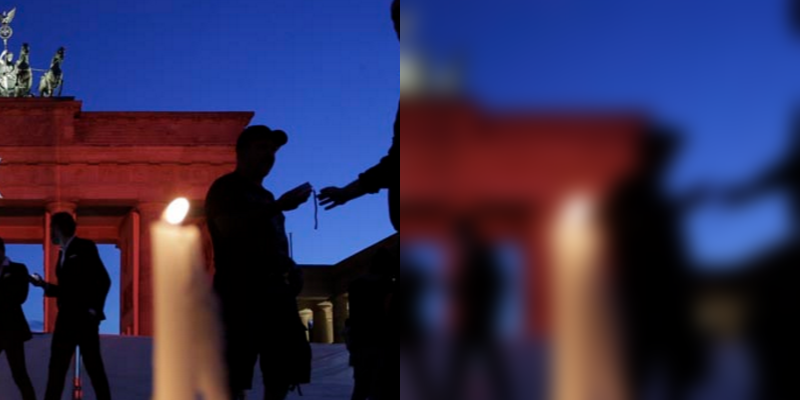

In [97]:
out = im.filter(ImageFilter.GaussianBlur(radius=10))
composite_two(im, out)

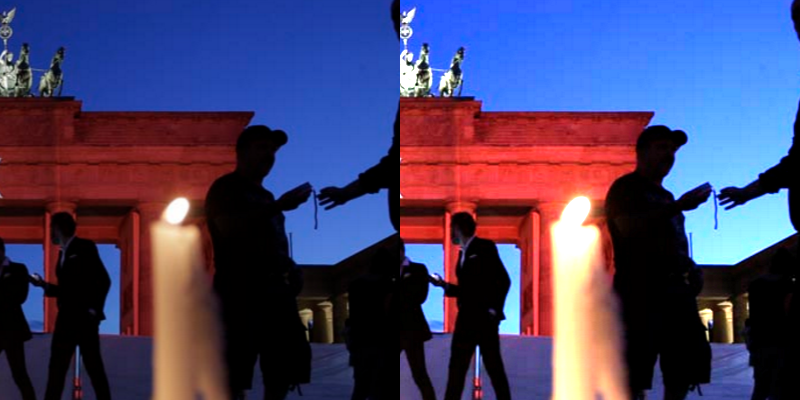

In [99]:
out = im.point(lambda i: i * 2)
composite_two(im, out)

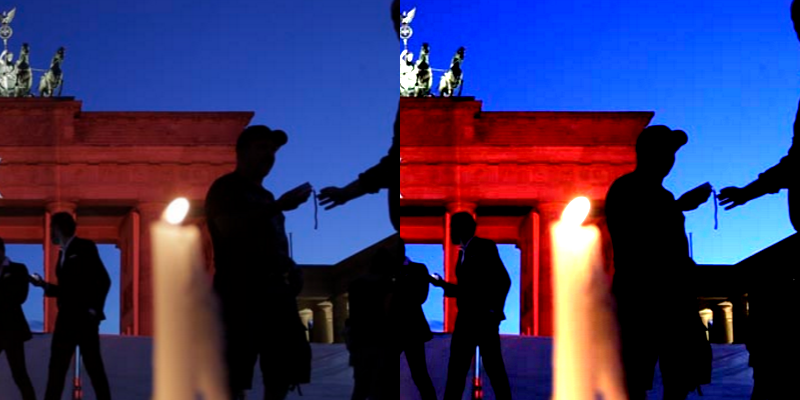

In [102]:
from PIL import ImageEnhance

enh = ImageEnhance.Contrast(im)
composite_two(im, enh.enhance(2.3))

In [106]:
i = im.load()
i